<a href="https://colab.research.google.com/github/peculab/UW_AgenticAI/blob/main/Trading_AgenticAI_GAF_CNN_DQN_Demo.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
# Notebook/local-ready version.
# In notebook runtimes, charts can be displayed inline. In local terminal runs,
# charts and selected result tables are written to the results folder.

from pathlib import Path as _Path
import importlib.util as _importlib_util
import json as _json
import os as _os
import sys as _sys

try:
    from IPython.display import display, Markdown
except Exception:
    Markdown = None
    def display(*objs, **kwargs):
        for obj in objs:
            print(obj)

IN_NOTEBOOK = _importlib_util.find_spec("IPython") is not None
try:
    _SCRIPT_DIR = _Path(__file__).resolve().parent
except NameError:
    _SCRIPT_DIR = _Path.cwd()

try:
    import plotly.io as _pio
    _pio.renderers.default = "notebook_connected" if IN_NOTEBOOK else "browser"
except Exception as _exc:
    print(f"Plotly renderer setup skipped: {_exc}")

SHOW_PLOTS = IN_NOTEBOOK or _os.getenv("SHOW_PLOTS", "0").lower() in {"1", "true", "yes"}
SAVE_RESULTS = (not IN_NOTEBOOK) or _os.getenv("SAVE_RESULTS", "0").lower() in {"1", "true", "yes"}
RESULTS_DIR = _SCRIPT_DIR / "results"
_PLOT_COUNTER = 0


def _safe_name(name):
    return "".join(ch if ch.isalnum() or ch in {"-", "_"} else "_" for ch in str(name)).strip("_")


def show_plot(fig, name=None):
    global _PLOT_COUNTER
    if SAVE_RESULTS:
        RESULTS_DIR.mkdir(parents=True, exist_ok=True)
        _PLOT_COUNTER += 1
        output_name = _safe_name(name or f"plotly_figure_{_PLOT_COUNTER:02d}")
        output_path = RESULTS_DIR / f"{output_name}.html"
        fig.write_html(str(output_path), include_plotlyjs="cdn")
        print(f"Saved Plotly chart: {output_path}")
    if SHOW_PLOTS:
        fig.show()
    else:
        print("Plot display skipped. Set SHOW_PLOTS=1 to display charts.")


def show_matplotlib_plot(name=None):
    global _PLOT_COUNTER
    if SAVE_RESULTS:
        RESULTS_DIR.mkdir(parents=True, exist_ok=True)
        _PLOT_COUNTER += 1
        output_name = _safe_name(name or f"matplotlib_figure_{_PLOT_COUNTER:02d}")
        output_path = RESULTS_DIR / f"{output_name}.png"
        plt.savefig(output_path, dpi=160, bbox_inches="tight")
        print(f"Saved Matplotlib chart: {output_path}")
    if SHOW_PLOTS:
        plt.show()
    else:
        plt.close()
        print("Matplotlib display skipped. Set SHOW_PLOTS=1 to display charts.")

def _install_result_hooks():
    """Compatibility no-op. Interactive environments display figures via normal show()."""
    return None

def _json_default(obj):
    try:
        import numpy as np
        if isinstance(obj, np.generic):
            return obj.item()
        if isinstance(obj, np.ndarray):
            return obj.tolist()
    except Exception:
        pass
    try:
        import pandas as pd
        if isinstance(obj, (pd.Timestamp, pd.Timedelta)):
            return str(obj)
        if isinstance(obj, pd.Series):
            return obj.to_dict()
        if isinstance(obj, pd.DataFrame):
            return obj.to_dict(orient="records")
    except Exception:
        pass
    return str(obj)

def _save_object(name, obj):
    """Save lightweight result objects when running locally."""
    if not SAVE_RESULTS:
        return None
    RESULTS_DIR.mkdir(parents=True, exist_ok=True)
    safe = _safe_name(name)
    try:
        import pandas as pd
        if isinstance(obj, pd.DataFrame):
            path = RESULTS_DIR / f"{safe}.csv"
            obj.to_csv(path, index=True)
            print(f"Saved DataFrame: {path}")
            return path
        if isinstance(obj, pd.Series):
            path = RESULTS_DIR / f"{safe}.json"
            path.write_text(_json.dumps(obj.to_dict(), indent=2, default=_json_default), encoding="utf-8")
            print(f"Saved Series: {path}")
            return path
    except Exception:
        pass
    path = RESULTS_DIR / f"{safe}.json"
    path.write_text(_json.dumps(obj, indent=2, default=_json_default), encoding="utf-8")
    print(f"Saved object: {path}")
    return path

def _save_named_results(scope, cell_idx=None):
    """Save selected teaching outputs without dumping large tensors."""
    if not SAVE_RESULTS:
        return None
    names = [
        "current_signal",
        "cnn_signal_table",
        "search_results",
        "ranked_results",
        "best_params",
        "decision_explanations",
        "summary",
        "agentic_context",
        "agentic_llm_report",
    ]
    for name in names:
        if name in scope:
            _save_object(name, scope[name])
    return None




# Agentic AI FX Trading Demo: GAF-CNN + DQN

This notebook is a 15-minute demo scaffold for an agentic FX trading workflow.

1. Encode OHLC candlestick windows as GAF images and train a CNN to classify the current signal.
2. Train a compact Deep Q Network to choose long / flat / short actions.
3. Apply the Lab 7 Agentic AI idea by wrapping the workflow in SignalAnalyst, StrategyAgent, RiskManager, and InterfaceAgent roles.

> For teaching only. This is not investment advice.
'''



## 0. Demo Flow

| Time | Focus |
|---:|---|
| 0-2 min | Load FX OHLC data and introduce candlestick-as-image modeling |
| 2-5 min | Build CULR channels and GAF image encoding |
| 5-8 min | Use a CNN to classify bullish / neutral / bearish signals |
| 8-12 min | Use DQN to select short / flat / long actions |
| 12-15 min | Use Agentic AI roles to generate an entry/exit recommendation |
'''



## Environment Setup

The cell below lists the packages needed by the demo. Set `RUN_INSTALL = True` if the current runtime does not already have these packages.
'''



In [2]:
from pathlib import Path
import subprocess
import sys
import os

REQUIREMENTS = [
    line.strip() for line in """
tensorflow==2.21.0
yfinance==1.3.0
scikit-learn==1.7.2
matplotlib==3.10.9
pandas==2.3.3
numpy==2.2.6
google-genai
""".strip().splitlines()
]

print("Demo package requirements:")
print("\n".join(REQUIREMENTS))

RUN_INSTALL = False  # Change to True to install packages in the current runtime.

if RUN_INSTALL:
    subprocess.check_call([sys.executable, "-m", "pip", "install", "-q", *REQUIREMENTS])
    print("Package installation complete. Runtime restart may be needed if older packages were already loaded.")
else:
    print("Local runtime detected; skipping pip install. Set RUN_INSTALL = True to install anyway.")

_save_named_results(globals(), cell_idx=3)



Demo package requirements:
tensorflow==2.21.0
yfinance==1.3.0
scikit-learn==1.7.2
matplotlib==3.10.9
pandas==2.3.3
numpy==2.2.6
google-genai
Local runtime detected; skipping pip install. Set RUN_INSTALL = True to install anyway.


In [9]:
import requests

# URL of the raw model file on GitHub
model_url = 'https://github.com/peculab/UW_AgenticAI/raw/main/cnn_model_10bar.h5'
output_path = '/content/cnn_model_10bar.h5'

print(f'Downloading model from {model_url}...')
response = requests.get(model_url, stream=True)
response.raise_for_status() # Raise an exception for HTTP errors

with open(output_path, 'wb') as f:
    for chunk in response.iter_content(chunk_size=8192):
        f.write(chunk)

print(f'Model downloaded to {output_path}')

Model downloaded to /content/cnn_model_10bar.h5


In [10]:
PRETRAINED_CNN_MODEL_PATH = Path('/content/cnn_model_10bar.h5')
print(f'PRETRAINED_CNN_MODEL_PATH updated to: {PRETRAINED_CNN_MODEL_PATH}')

PRETRAINED_CNN_MODEL_PATH updated to: /content/cnn_model_10bar.h5


In [3]:
import random
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import yfinance as yf

import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
from sklearn.utils.class_weight import compute_class_weight

SEED = 7
np.random.seed(SEED)
random.seed(SEED)
tf.random.set_seed(SEED)

TICKER = "EURUSD=X"   # try GBPUSD=X, AUDUSD=X, JPY=X
PERIOD = "730d"
INTERVAL = "1h"
WINDOW = 10
HORIZON = 8
COST = 0.00002

PRETRAINED_CNN_MODEL_PATH = _SCRIPT_DIR / "cnn_model_10bar.h5"
USE_PRETRAINED_CNN = True
EVALUATE_PROXY_RULE_LABELS = False

pattern_class_names = [
    "doji",
    "hammer",
    "hanging_man",
    "shooting_star",
    "bullish_engulfing",
    "bearish_engulfing",
    "morning_star",
    "evening_star",
    "unknown",
]
class_names = pattern_class_names
signal_names = ["bearish", "neutral", "bullish"]
pattern_to_bias = {
    "doji": "neutral",
    "hammer": "bullish",
    "hanging_man": "bearish",
    "shooting_star": "bearish",
    "bullish_engulfing": "bullish",
    "bearish_engulfing": "bearish",
    "morning_star": "bullish",
    "evening_star": "bearish",
    "unknown": "neutral",
}
bias_to_signal_id = {"bearish": 0, "neutral": 1, "bullish": 2}
pattern_bias_ids = np.array([bias_to_signal_id[pattern_to_bias[name]] for name in pattern_class_names])

action_names = ["short", "flat", "long"]
action_to_position = np.array([-1, 0, 1], dtype=np.float32)

_install_result_hooks()


def ensure_pretrained_cnn_model(model_path=PRETRAINED_CNN_MODEL_PATH):
    """Return a local CNN model path."""
    model_path = Path(model_path)
    candidate_paths = [
        model_path,
        Path.cwd() / model_path.name,
        Path("/content") / model_path.name,
    ]
    for candidate in candidate_paths:
        if candidate.exists():
            return candidate

    raise FileNotFoundError(
        "Pretrained CNN model not found. Put cnn_model_10bar.h5 next to this script "
        "or in the current working directory."
    )

_save_named_results(globals(), cell_idx=4)



## 1. Load FX Data

The notebook downloads recent OHLC data from Yahoo Finance so the final row can be treated as the current market signal. If the download fails, it falls back to synthetic OHLC data so the class demo can continue.
'''



In [4]:
def make_synthetic_ohlc(n=1200, start=1.10):
    rng = np.random.default_rng(SEED)
    returns = rng.normal(0, 0.0008, n) + 0.0002 * np.sin(np.arange(n) / 25)
    close = start * np.exp(np.cumsum(returns))
    open_ = np.r_[close[0], close[:-1]]
    spread = rng.uniform(0.0001, 0.0012, n)
    high = np.maximum(open_, close) + spread
    low = np.minimum(open_, close) - spread
    idx = pd.date_range(end=pd.Timestamp.utcnow(), periods=n, freq="h")
    return pd.DataFrame({"Open": open_, "High": high, "Low": low, "Close": close, "Volume": 1}, index=idx)


def load_ohlc(ticker=TICKER, period=PERIOD, interval=INTERVAL):
    try:
        df = yf.download(ticker, period=period, interval=interval, auto_adjust=False, progress=False)
        if isinstance(df.columns, pd.MultiIndex):
            df.columns = df.columns.get_level_values(0)
        df = df[["Open", "High", "Low", "Close", "Volume"]].dropna()
        if len(df) < 250:
            raise ValueError(f"Only {len(df)} rows downloaded")
        print(f"Downloaded {len(df)} rows for {ticker}. Last timestamp: {df.index[-1]}")
        return df
    except Exception as e:
        print("Download failed; using synthetic data instead:", repr(e))
        return make_synthetic_ohlc()

raw = load_ohlc()
raw.tail()

_save_named_results(globals(), cell_idx=6)



Downloaded 17217 rows for EURUSD=X. Last timestamp: 2026-05-06 00:00:00+00:00


In [5]:
def add_continuous_time_axis(fig, times, row=None, col=None, max_ticks=10):
    times = pd.to_datetime(pd.Index(times))
    n = len(times)
    if n == 0:
        return fig
    step = max(1, n // max_ticks)
    tickvals = list(range(0, n, step))
    if tickvals[-1] != n - 1:
        tickvals.append(n - 1)
    ticktext = [times[i].strftime("%Y-%m-%d %H:%M") for i in tickvals]
    kwargs = {
        "tickmode": "array",
        "tickvals": tickvals,
        "ticktext": ticktext,
        "rangeslider": {"visible": False},
        "title_text": "Backtest bar index / time",
    }
    if row is None:
        fig.update_xaxes(**kwargs)
    else:
        fig.update_xaxes(row=row, col=col, **kwargs)
    return fig


def plot_price_candles_continuous(price_df, title, output_name=None):
    price_df = price_df[["Open", "High", "Low", "Close"]].dropna().copy()
    x = np.arange(len(price_df))
    time_text = pd.to_datetime(price_df.index).strftime("%Y-%m-%d %H:%M")
    fig = go.Figure(data=[go.Candlestick(
        x=x,
        open=price_df["Open"],
        high=price_df["High"],
        low=price_df["Low"],
        close=price_df["Close"],
        increasing_line_color="#2ca02c",
        decreasing_line_color="#d62728",
        text=[
            f"Time: {t}<br>Open: {o:.5f}<br>High: {h:.5f}<br>Low: {l:.5f}<br>Close: {c:.5f}"
            for t, o, h, l, c in zip(time_text, price_df["Open"], price_df["High"], price_df["Low"], price_df["Close"])
        ],
        hoverinfo="text",
        name="OHLC"
    )])
    fig.update_layout(
        title=f"{title} ({len(price_df):,} bars)",
        yaxis_title="Price",
        height=560,
        hovermode="x unified",
        margin={"l": 55, "r": 30, "t": 70, "b": 70},
        showlegend=False,
    )
    add_continuous_time_axis(fig, price_df.index)
    show_plot(fig, name=output_name or "price_candles")
    if output_name:
        _save_object(output_name, price_df)
    return price_df

# The exact backtest candlestick chart is generated after state_times is created.

_save_named_results(globals(), cell_idx=7)



## 2. Candlestick Window -> GAF Image

Inspired by *Encoding candlesticks as images for patterns classification using convolutional neural networks*:

- Convert OHLC into CULR: Close, Upper shadow, Lower shadow, and Real body
- Convert each channel into a Gramian Angular Summation Field
- The CNN input shape is `WINDOW x WINDOW x 4`
'''



In [6]:
def ohlc_to_culr(ohlc):
    o, h, l, c = ohlc[:, 0], ohlc[:, 1], ohlc[:, 2], ohlc[:, 3]
    upper = h - np.maximum(o, c)
    lower = np.minimum(o, c) - l
    real_body = c - o
    return np.stack([c, upper, lower, real_body], axis=1)


def ts_to_gasf(ts):
    ts = np.asarray(ts, dtype=np.float32)
    lo, hi = np.min(ts), np.max(ts)
    # Match the FinancialVision paper implementation: min-max scale to [0, 1]
    # before applying the Gramian Angular Summation Field transform.
    scaled = np.zeros_like(ts) if np.isclose(lo, hi) else (ts - lo) / (hi - lo)
    scaled = np.clip(scaled, 0, 1)
    phi = np.arccos(scaled)
    return np.cos(phi[:, None] + phi[None, :]).astype(np.float32)


def window_to_gaf(window_ohlc):
    culr = ohlc_to_culr(window_ohlc)
    return np.stack([ts_to_gasf(culr[:, i]) for i in range(4)], axis=-1)


def _candle_parts(row):
    o, h, l, c = float(row["Open"]), float(row["High"]), float(row["Low"]), float(row["Close"])
    body = abs(c - o)
    candle_range = max(h - l, 1e-8)
    upper_shadow = h - max(o, c)
    lower_shadow = min(o, c) - l
    return o, h, l, c, body, candle_range, upper_shadow, lower_shadow


def label_candlestick_pattern(window_df):
    candles = window_df[["Open", "High", "Low", "Close"]]
    last = candles.iloc[-1]
    o, h, l, c, body, candle_range, upper_shadow, lower_shadow = _candle_parts(last)
    body_ratio = body / candle_range
    recent_close = candles["Close"].tail(min(len(candles), 6)).values.astype(float)
    trend = recent_close[-1] - recent_close[0] if len(recent_close) >= 2 else 0.0

    pattern = "unknown"
    reason = "No 8-pattern rule matched, so the sample is labeled unknown."

    if body_ratio < 0.10:
        pattern = "doji"
        reason = "Open and close are very close relative to the high-low range."
    elif lower_shadow >= 2.0 * max(body, 1e-8) and upper_shadow <= 0.6 * max(body, 1e-8):
        if trend < 0:
            pattern = "hammer"
            reason = "Long lower shadow after a recent decline."
        else:
            pattern = "hanging_man"
            reason = "Long lower shadow after a flat/upward recent move."
    elif upper_shadow >= 2.0 * max(body, 1e-8) and lower_shadow <= 0.6 * max(body, 1e-8):
        pattern = "shooting_star"
        reason = "Long upper shadow with the real body near the low."

    if len(candles) >= 2:
        prev = candles.iloc[-2]
        po, ph, pl, pc, prev_body, prev_range, _, _ = _candle_parts(prev)
        prev_bear = pc < po
        prev_bull = pc > po
        curr_bull = c > o
        curr_bear = c < o
        if prev_bear and curr_bull and o <= pc and c >= po:
            pattern = "bullish_engulfing"
            reason = "Latest bullish body engulfs the previous bearish body."
        elif prev_bull and curr_bear and o >= pc and c <= po:
            pattern = "bearish_engulfing"
            reason = "Latest bearish body engulfs the previous bullish body."

    if len(candles) >= 3:
        c1, c2, c3 = candles.iloc[-3], candles.iloc[-2], candles.iloc[-1]
        o1, h1, l1, cl1, b1, r1, _, _ = _candle_parts(c1)
        o2, h2, l2, cl2, b2, r2, _, _ = _candle_parts(c2)
        o3, h3, l3, cl3, b3, r3, _, _ = _candle_parts(c3)
        midpoint_1 = (o1 + cl1) / 2
        small_middle = b2 / max(r2, 1e-8) < 0.35
        if cl1 < o1 and small_middle and cl3 > o3 and cl3 > midpoint_1:
            pattern = "morning_star"
            reason = "Bearish candle, small indecision candle, then bullish recovery above midpoint."
        elif cl1 > o1 and small_middle and cl3 < o3 and cl3 < midpoint_1:
            pattern = "evening_star"
            reason = "Bullish candle, small indecision candle, then bearish drop below midpoint."

    bias = pattern_to_bias[pattern]
    return {"pattern": pattern, "label_id": pattern_class_names.index(pattern), "bias": bias, "reason": reason}


def detect_candlestick_pattern(window_df):
    return label_candlestick_pattern(window_df)


def pattern_probs_to_signal_probs(pattern_probs):
    pattern_probs = np.asarray(pattern_probs, dtype=np.float32)
    signal_probs = np.zeros((pattern_probs.shape[0], len(signal_names)), dtype=np.float32)
    for pattern_id, signal_id in enumerate(pattern_bias_ids):
        signal_probs[:, signal_id] += pattern_probs[:, pattern_id]
    return signal_probs


def make_supervised_dataset(df, window=WINDOW, horizon=HORIZON):
    ohlc = df[["Open", "High", "Low", "Close"]].values.astype(np.float32)
    close = df["Close"].values.astype(np.float32)
    X, y, times, future_returns, pattern_rows = [], [], [], [], []
    for end in range(window - 1, len(df) - horizon):
        start = end - window + 1
        window_df = df.iloc[start:end + 1][["Open", "High", "Low", "Close"]]
        label_info = label_candlestick_pattern(window_df)
        future_ret = (close[end + horizon] - close[end]) / close[end]
        X.append(window_to_gaf(ohlc[start:end + 1]))
        y.append(label_info["label_id"])
        times.append(df.index[end])
        future_returns.append(future_ret)
        pattern_rows.append({"time": df.index[end], "pattern": label_info["pattern"], "bias": label_info["bias"], "reason": label_info["reason"]})
    return np.array(X), np.array(y), np.array(times), np.array(future_returns), pd.DataFrame(pattern_rows)


X, y, times, future_returns, pattern_label_table = make_supervised_dataset(raw)
print("X shape:", X.shape)
print("label distribution:", dict(zip(*np.unique(y, return_counts=True))))
print(pattern_label_table["pattern"].value_counts())

_save_named_results(globals(), cell_idx=9)



X shape: (17200, 10, 10, 4)
label distribution: {np.int64(0): np.int64(1858), np.int64(1): np.int64(227), np.int64(2): np.int64(250), np.int64(3): np.int64(656), np.int64(4): np.int64(1127), np.int64(5): np.int64(1063), np.int64(6): np.int64(865), np.int64(7): np.int64(855), np.int64(8): np.int64(10299)}
pattern
unknown              10299
doji                  1858
bullish_engulfing     1127
bearish_engulfing     1063
morning_star           865
evening_star           855
shooting_star          656
hanging_man            250
hammer                 227
Name: count, dtype: int64


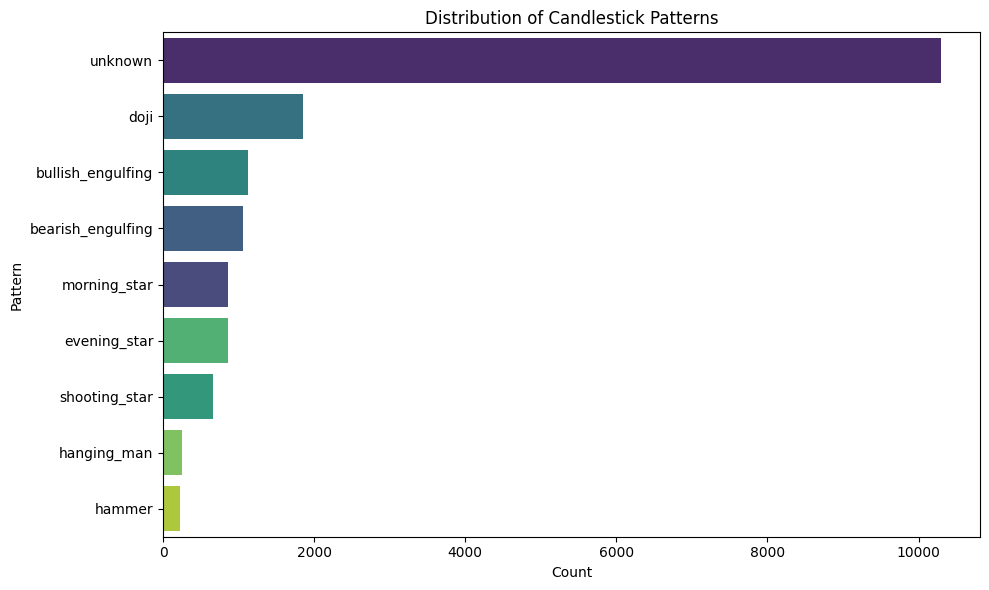

In [14]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 6))
sns.countplot(y='pattern', data=pattern_label_table, order=pattern_label_table['pattern'].value_counts().index, hue='pattern', legend=False, palette='viridis')
plt.title('Distribution of Candlestick Patterns')
plt.xlabel('Count')
plt.ylabel('Pattern')
plt.tight_layout()
plt.show()

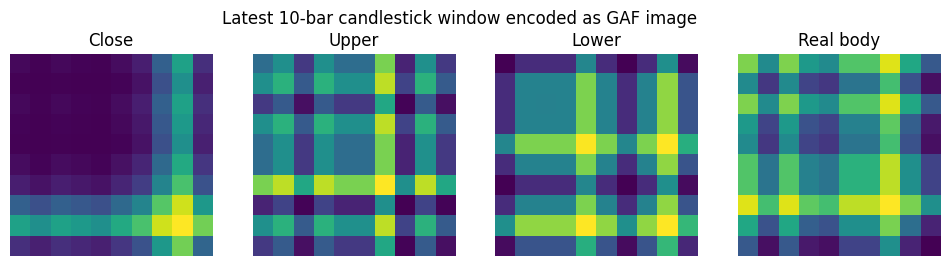

In [7]:
fig, axes = plt.subplots(1, 4, figsize=(12, 3))
for i, name in enumerate(["Close", "Upper", "Lower", "Real body"]):
    axes[i].imshow(X[-1, :, :, i], cmap="viridis", vmin=-1, vmax=1)
    axes[i].set_title(name)
    axes[i].axis("off")
plt.suptitle(f"Latest {WINDOW}-bar candlestick window encoded as GAF image")
show_matplotlib_plot("latest_gaf_channels")

_save_named_results(globals(), cell_idx=10)



## 3. CNN Candlestick Pattern Classifier

This demo now loads the pretrained CNN from the FinancialVision paper folder instead of training a new CNN during class. The loaded model outputs 8 candlestick pattern classes plus `unknown`; those 9 pattern probabilities are passed directly into the DQN state and also mapped into bearish / neutral / bullish bias for explanation.
'''



In [11]:
def build_financialvision_cnn_model(num_classes=len(pattern_class_names)):
    model = keras.Sequential([
        layers.Input(shape=(WINDOW, WINDOW, 4)),
        layers.Conv2D(16, (2, 2), padding="same", strides=(1, 1)),
        layers.Activation("sigmoid"),
        layers.Conv2D(16, (2, 2), padding="same", strides=(1, 1)),
        layers.Activation("sigmoid"),
        layers.Flatten(),
        layers.Dense(128, activation="relu"),
        layers.Dense(num_classes),
        layers.Activation("softmax"),
    ])
    return model


def load_pretrained_cnn(model_path=PRETRAINED_CNN_MODEL_PATH):
    model_path = ensure_pretrained_cnn_model(model_path)

    try:
        model = keras.models.load_model(str(model_path), compile=False)
        load_mode = "full Keras model"
    except Exception as exc:
        print("Full model load failed; trying FinancialVision architecture + load_weights:", repr(exc))
        model = build_financialvision_cnn_model()
        model.load_weights(str(model_path))
        load_mode = "weights into FinancialVision architecture"

    input_shape = tuple(model.input_shape[1:])
    output_classes = int(model.output_shape[-1])
    expected_input = (WINDOW, WINDOW, 4)
    if input_shape != expected_input:
        raise ValueError(f"Pretrained CNN input shape {input_shape} does not match expected {expected_input}.")
    if output_classes != len(pattern_class_names):
        raise ValueError(
            f"Pretrained CNN output classes {output_classes} does not match pattern_class_names length "
            f"{len(pattern_class_names)}. Check the model/class mapping."
        )

    print(f"Loaded pretrained CNN from {model_path}")
    print(f"Load mode: {load_mode}")
    print("CNN input shape:", model.input_shape, "output shape:", model.output_shape)
    print("Pattern class order used by this demo:", pattern_class_names)
    return model


if not USE_PRETRAINED_CNN:
    raise RuntimeError("USE_PRETRAINED_CNN must stay True for this demo; CNN training has been disabled.")

cnn = load_pretrained_cnn()

_save_named_results(globals(), cell_idx=12)


Loaded pretrained CNN from /content/cnn_model_10bar.h5
Load mode: full Keras model
CNN input shape: (None, 10, 10, 4) output shape: (None, 9)
Pattern class order used by this demo: ['doji', 'hammer', 'hanging_man', 'shooting_star', 'bullish_engulfing', 'bearish_engulfing', 'morning_star', 'evening_star', 'unknown']


In [15]:
split = int(len(X) * 0.8)
X_train, X_test = X[:split], X[split:]
y_train, y_test = y[:split], y[split:]

if EVALUATE_PROXY_RULE_LABELS:
    proba_test = cnn.predict(X_test, verbose=0)
    pred_test = np.argmax(proba_test, axis=1)
    confidence_test = np.max(proba_test, axis=1)
    high_conf_mask = confidence_test >= 0.45
    labels_all = np.arange(len(pattern_class_names))
    print("proxy rule-label pattern accuracy:", round(accuracy_score(y_test, pred_test), 4))
    if high_conf_mask.any():
        print("high-confidence coverage:", round(float(high_conf_mask.mean()), 3))
        print("high-confidence proxy pattern accuracy:", round(accuracy_score(y_test[high_conf_mask], pred_test[high_conf_mask]), 4))
    else:
        print("high-confidence coverage: 0.0")
    print(classification_report(y_test, pred_test, labels=labels_all, target_names=pattern_class_names, zero_division=0))
    print("Confusion matrix:\n", confusion_matrix(y_test, pred_test, labels=labels_all))

    signal_proba_test = pattern_probs_to_signal_probs(proba_test)
    signal_pred_test = np.argmax(signal_proba_test, axis=1)
    y_test_signal = pattern_bias_ids[y_test]
    print("proxy bias signal accuracy:", round(accuracy_score(y_test_signal, signal_pred_test), 4))
    print(classification_report(y_test_signal, signal_pred_test, labels=np.arange(3), target_names=signal_names, zero_division=0))
else:
    print("Skipping proxy rule-label evaluation. The CNN is loaded from the pretrained paper model and is not retrained here.")
    print("Set EVALUATE_PROXY_RULE_LABELS = True only if you want a rough comparison against this demo's rule labels.")

_save_named_results(globals(), cell_idx=13)



Skipping proxy rule-label evaluation. The CNN is loaded from the pretrained paper model and is not retrained here.
Set EVALUATE_PROXY_RULE_LABELS = True only if you want a rough comparison against this demo's rule labels.


## 3.5 CNN Pattern Overlay on Price

After the CNN has generated probabilities for each GAF window, this chart overlays high-confidence CNN candlestick pattern predictions and their bullish / bearish / neutral bias on the original price chart.
'''



In [16]:
!pip install nbformat

In [17]:
from IPython.display import HTML, display

SHOW_PLOTS = True

def show_plot(fig, name=None):
    global _PLOT_COUNTER

    if SAVE_RESULTS:
        RESULTS_DIR.mkdir(parents=True, exist_ok=True)
        _PLOT_COUNTER += 1
        output_name = _safe_name(name or f"plotly_figure_{_PLOT_COUNTER:02d}")
        output_path = RESULTS_DIR / f"{output_name}.html"
        fig.write_html(str(output_path), include_plotlyjs="cdn")
        print(f"Saved Plotly chart: {output_path}")

    display(HTML(fig.to_html(include_plotlyjs="cdn", full_html=False)))

In [18]:
def build_cnn_signal_table(model, max_points=None, confidence_threshold=0.50):
    pattern_probs = model.predict(X, verbose=0).astype(np.float32)
    signal_probs = pattern_probs_to_signal_probs(pattern_probs)
    pattern_pred = np.argmax(pattern_probs, axis=1)
    signal_pred = np.argmax(signal_probs, axis=1)
    conf = np.max(pattern_probs, axis=1)
    start_idx = 0 if max_points is None else max(0, len(X) - max_points)
    rows = []
    for sample_idx in range(start_idx, len(X)):
        end_raw_idx = sample_idx + WINDOW - 1
        start_raw_idx = end_raw_idx - WINDOW + 1
        window_df = raw.iloc[start_raw_idx:end_raw_idx + 1][["Open", "High", "Low", "Close"]]
        true_pattern = detect_candlestick_pattern(window_df)
        pred_pattern = pattern_class_names[int(pattern_pred[sample_idx])]
        rows.append({
            "sample_idx": sample_idx,
            "time": raw.index[end_raw_idx],
            "price": float(raw["Close"].iloc[end_raw_idx]),
            "cnn_pattern": pred_pattern,
            "cnn_signal": signal_names[int(signal_pred[sample_idx])],
            "cnn_confidence": float(conf[sample_idx]),
            "cnn_bearish": float(signal_probs[sample_idx, 0]),
            "cnn_neutral": float(signal_probs[sample_idx, 1]),
            "cnn_bullish": float(signal_probs[sample_idx, 2]),
            "true_pattern_label": pattern_class_names[int(y[sample_idx])],
            "future_return": float(future_returns[sample_idx]),
            "pattern": true_pattern["pattern"],
            "pattern_bias": true_pattern["bias"],
            "pattern_reason": true_pattern["reason"],
            "window_start": str(window_df.index[0]),
            "window_end": str(window_df.index[-1]),
            "is_high_confidence": bool(conf[sample_idx] >= confidence_threshold),
        })
    return pd.DataFrame(rows)


def plot_cnn_signal_price_chart(model, max_points=None, confidence_threshold=0.50):
    signal_df = build_cnn_signal_table(model, max_points=max_points, confidence_threshold=confidence_threshold)
    price_df = raw.loc[signal_df["time"].iloc[0]:signal_df["time"].iloc[-1], ["Open", "High", "Low", "Close"]].copy()
    price_index = pd.Index(price_df.index)
    signal_df = signal_df.copy()
    signal_df["bar_index"] = price_index.get_indexer(pd.to_datetime(signal_df["time"]))
    signal_df = signal_df[signal_df["bar_index"] >= 0].copy()

    fig = go.Figure()
    fig.add_trace(go.Candlestick(
        x=np.arange(len(price_df)),
        open=price_df["Open"],
        high=price_df["High"],
        low=price_df["Low"],
        close=price_df["Close"],
        increasing_line_color="#2ca02c",
        decreasing_line_color="#d62728",
        name="OHLC"
    ))

    marker_specs = {
        "bullish": {"color": "#2ca02c", "symbol": "triangle-up", "name": "Bullish pattern bias"},
        "bearish": {"color": "#d62728", "symbol": "triangle-down", "name": "Bearish pattern bias"},
        "neutral": {"color": "#7f7f7f", "symbol": "circle", "name": "Neutral / unknown"},
    }
    hover_cols = [
        "cnn_pattern", "cnn_signal", "cnn_confidence", "cnn_bearish", "cnn_neutral", "cnn_bullish",
        "true_pattern_label", "future_return", "pattern", "pattern_bias", "pattern_reason",
        "window_start", "window_end", "sample_idx"
    ]
    hover_template = (
        "%{x}<br>Close: %{y:.5f}<br>"
        "CNN pattern: %{customdata[0]}<br>"
        "Pattern bias: %{customdata[1]} | confidence: %{customdata[2]:.3f}<br>"
        "Bias probs B/N/U: %{customdata[3]:.3f} / %{customdata[4]:.3f} / %{customdata[5]:.3f}<br>"
        "Rule label: %{customdata[6]} | future return: %{customdata[7]:.4%}<br>"
        "Pattern rule: %{customdata[8]} (%{customdata[9]})<br>"
        "Rule reason: %{customdata[10]}<br>"
        "GAF window: %{customdata[11]} -> %{customdata[12]}<br>"
        "sample_idx: %{customdata[13]}<extra></extra>"
    )

    for signal, spec in marker_specs.items():
        subset = signal_df[(signal_df["cnn_signal"] == signal) & signal_df["is_high_confidence"]]
        if len(subset) == 0:
            continue
        fig.add_trace(go.Scatter(
            x=subset["bar_index"],
            y=subset["price"],
            mode="markers",
            name=f"{spec['name']} >= {confidence_threshold:.2f}",
            marker={"color": spec["color"], "symbol": spec["symbol"], "size": 9, "line": {"width": 1, "color": "white"}},
            customdata=subset[hover_cols].to_numpy(),
            hovertemplate=hover_template
        ))

    fig.update_layout(
        title=f"{TICKER} full backtest price with high-confidence CNN candlestick patterns",
        yaxis_title="Price",
        xaxis_title="Time",
        height=650,
        hovermode="closest",
        legend={"orientation": "h", "y": 1.05, "x": 0},
        margin={"l": 50, "r": 30, "t": 90, "b": 40}
    )
    add_continuous_time_axis(fig, price_df.index)
    show_plot(fig, name="cnn_signal_price_chart")
    return signal_df


cnn_signal_table = plot_cnn_signal_price_chart(cnn, max_points=None, confidence_threshold=0.50)
cnn_signal_table.tail(10)

_save_named_results(globals(), cell_idx=15)

In [19]:
def predict_current_signal(model, df):
    last_window_df = df[["Open", "High", "Low", "Close"]].tail(WINDOW)
    image = window_to_gaf(last_window_df.values.astype(np.float32))[None, ...]
    pattern_proba = model.predict(image, verbose=0)[0]
    signal_proba = pattern_probs_to_signal_probs(pattern_proba[None, :])[0]
    pattern_id = int(np.argmax(pattern_proba))
    signal_id = int(np.argmax(signal_proba))
    rule_pattern = detect_candlestick_pattern(last_window_df)
    return {
        "timestamp": str(df.index[-1]),
        "cnn_output_type": "9-class candlestick pattern classifier; bias is derived from pattern probabilities",
        "label": pattern_class_names[pattern_id],
        "bias_label": signal_names[signal_id],
        "probabilities": dict(zip(pattern_class_names, pattern_proba.round(3).tolist())),
        "bias_probabilities": dict(zip(signal_names, signal_proba.round(3).tolist())),
        "rule_based_candlestick_pattern": rule_pattern,
    }

current_signal = predict_current_signal(cnn, raw)
current_signal

_save_named_results(globals(), cell_idx=16)



GAF/CNN inspection
sample_idx: 17199
window start: 2026-05-05 07:00:00+00:00
window end / prediction time: 2026-05-05 16:00:00+00:00
CNN output type: 9-class candlestick pattern classifier
rule label: evening_star | Bullish candle, small indecision candle, then bearish drop below midpoint.
CNN predicted pattern: hammer
CNN pattern probabilities: {'doji': 0.014000000432133675, 'hammer': 0.8610000014305115, 'hanging_man': 0.0, 'shooting_star': 0.125, 'bullish_engulfing': 0.0, 'bearish_engulfing': 0.0, 'morning_star': 0.0, 'evening_star': 0.0, 'unknown': 0.0}
Derived bias signal: bullish {'bearish': 0.12600000202655792, 'neutral': 0.014000000432133675, 'bullish': 0.8610000014305115}
Future return for RL reward: 0.001876


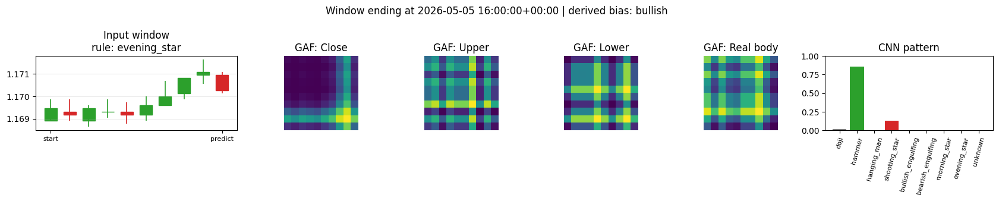

In [20]:
def inspect_gaf_cnn_window(sample_idx=-1):
    if sample_idx < 0:
        sample_idx = len(X) + sample_idx

    end_raw_idx = sample_idx + WINDOW - 1
    start_raw_idx = end_raw_idx - WINDOW + 1
    window_df = raw.iloc[start_raw_idx:end_raw_idx + 1][["Open", "High", "Low", "Close"]]

    image = X[sample_idx]
    pattern_proba = cnn.predict(image[None, ...], verbose=0)[0]
    signal_proba = pattern_probs_to_signal_probs(pattern_proba[None, :])[0]
    pred_pattern_id = int(np.argmax(pattern_proba))
    pred_signal_id = int(np.argmax(signal_proba))
    rule_pattern = detect_candlestick_pattern(window_df)

    print("GAF/CNN inspection")
    print("sample_idx:", sample_idx)
    print("window start:", window_df.index[0])
    print("window end / prediction time:", window_df.index[-1])
    print("CNN output type: 9-class candlestick pattern classifier")
    print("rule label:", pattern_class_names[int(y[sample_idx])], "|", rule_pattern["reason"])
    print("CNN predicted pattern:", pattern_class_names[pred_pattern_id])
    print("CNN pattern probabilities:", dict(zip(pattern_class_names, pattern_proba.round(3).tolist())))
    print("Derived bias signal:", signal_names[pred_signal_id], dict(zip(signal_names, signal_proba.round(3).tolist())))
    print("Future return for RL reward:", f"{future_returns[sample_idx]:.6f}")

    fig, axes = plt.subplots(1, 6, figsize=(17, 3.4), gridspec_kw={"width_ratios": [1.8, 1, 1, 1, 1, 1.5]})

    ax = axes[0]
    for i, (_, row) in enumerate(window_df.iterrows()):
        o, h, l, c = row["Open"], row["High"], row["Low"], row["Close"]
        color = "#2ca02c" if c >= o else "#d62728"
        ax.vlines(i, l, h, color=color, linewidth=1.2)
        body_low = min(o, c)
        body_height = max(abs(c - o), 1e-6)
        ax.add_patch(plt.Rectangle((i - 0.32, body_low), 0.64, body_height,
                                   facecolor=color, edgecolor=color, linewidth=1))
    ax.set_title(f"Input window\nrule: {rule_pattern['pattern']}")
    ax.set_xticks([0, len(window_df) - 1])
    ax.set_xticklabels(["start", "predict"], fontsize=8)
    ax.grid(True, axis="y", alpha=0.25)

    for channel, name in enumerate(["Close", "Upper", "Lower", "Real body"]):
        axes[channel + 1].imshow(image[:, :, channel], cmap="viridis", vmin=-1, vmax=1)
        axes[channel + 1].set_title(f"GAF: {name}")
        axes[channel + 1].axis("off")

    colors = ["#7f7f7f", "#2ca02c", "#d62728", "#d62728", "#2ca02c", "#d62728", "#2ca02c", "#d62728", "#aaaaaa"]
    axes[-1].bar(pattern_class_names, pattern_proba, color=colors)
    axes[-1].set_ylim(0, 1)
    axes[-1].set_title("CNN pattern")
    axes[-1].tick_params(axis="x", rotation=75, labelsize=8)

    plt.suptitle(f"Window ending at {window_df.index[-1]} | derived bias: {signal_names[pred_signal_id]}")
    plt.tight_layout()
    show_matplotlib_plot(f"gaf_cnn_window_{sample_idx}")


# Change this index to inspect another historical window, e.g. -20, -100, or 250.
inspect_gaf_cnn_window(sample_idx=-1)

_save_named_results(globals(), cell_idx=17)



## 4. Mini DQN Trading Strategy

Inspired by *Deep Reinforcement Learning for Foreign Exchange Trading*, this section uses a small DQN-style loop:

- state = recent returns + CNN signal probabilities
- action = short / flat / long
- reward = position * next_return - transaction_cost

This is not a complete trading system. It is a compact DRL core loop that students can run, inspect, and modify.
'''



In [21]:
close = raw["Close"].values.astype(np.float32)
returns = pd.Series(close).pct_change().fillna(0).values.astype(np.float32)
cnn_pattern_probs = cnn.predict(X, verbose=0).astype(np.float32)
cnn_pattern_confidence = np.max(cnn_pattern_probs, axis=1).astype(np.float32)
cnn_pattern_pred = np.argmax(cnn_pattern_probs, axis=1)

# QRL/DQN uses the 8+1 GAF CNN pattern probabilities directly as its signal input.
# The 3-way bearish / neutral / bullish bias is kept only for reporting and guardrails.
cnn_probs = pattern_probs_to_signal_probs(cnn_pattern_probs).astype(np.float32)
cnn_confidence = cnn_pattern_confidence

# Confidence thresholds for trading decisions
CNN_CONFIDENCE_THRESHOLD = 0.60  # Minimum threshold for including pattern in state
CNN_HIGH_CONFIDENCE_THRESHOLD = 0.75  # Higher threshold for reliable trade signals

unknown_pattern_signal = np.zeros(len(pattern_class_names), dtype=np.float32)
unknown_pattern_signal[pattern_class_names.index("unknown")] = 1.0
cnn_pattern_probs_for_state = np.where(
    cnn_pattern_confidence[:, None] >= CNN_CONFIDENCE_THRESHOLD,
    cnn_pattern_probs,
    unknown_pattern_signal
).astype(np.float32)
print("CNN pattern high-confidence coverage:", round(float((cnn_pattern_confidence >= CNN_CONFIDENCE_THRESHOLD).mean()), 3))
print("DQN state signal type: 8+1 GAF CNN pattern probabilities")

STATE_RETURNS = 12
valid_start = max(WINDOW - 1, STATE_RETURNS)
states, rewards_returns, state_times, state_sample_idx = [], [], [], []
for i in range(valid_start, len(X) - 1):
    raw_idx = i + WINDOW - 1
    recent_returns = returns[raw_idx-STATE_RETURNS+1:raw_idx+1]
    states.append(np.r_[recent_returns, cnn_pattern_probs_for_state[i], cnn_confidence[i]])
    rewards_returns.append((close[raw_idx+1] - close[raw_idx]) / close[raw_idx])
    state_times.append(raw.index[raw_idx])
    state_sample_idx.append(i)

states = np.array(states, dtype=np.float32)
rewards_returns = np.array(rewards_returns, dtype=np.float32)
state_times = np.array(state_times)
state_sample_idx = np.array(state_sample_idx)
print("DQN state shape:", states.shape, "=", STATE_RETURNS, "returns +", len(pattern_class_names), "pattern probs + 1 confidence")
print("reward shape:", rewards_returns.shape)

backtest_price_df = raw.loc[pd.to_datetime(state_times[0]):pd.to_datetime(state_times[-1]), ["Open", "High", "Low", "Close"]].copy()
backtest_price_df = plot_price_candles_continuous(
    backtest_price_df,
    title=f"{TICKER} full backtest-used OHLC candlestick chart",
    output_name="backtest_price_ohlc"
)

_save_named_results(globals(), cell_idx=19)



CNN pattern high-confidence coverage: 0.843
DQN state signal type: 8+1 GAF CNN pattern probabilities
DQN state shape: (17187, 22) = 12 returns + 9 pattern probs + 1 confidence
reward shape: (17187,)


In [22]:
qnet = keras.Sequential([
    layers.Input(shape=(states.shape[1],)),
    layers.Dense(32, activation="relu"),
    layers.Dense(32, activation="relu"),
    layers.Dense(3)
])
qnet.compile(optimizer=keras.optimizers.Adam(0.001), loss="mse")


def train_dqn(states, future_ret, episodes=15, gamma=0.98, epsilon=0.30, max_steps=300):
    """Enhanced DQN training for better pattern recognition and strategy learning.

    Args:
        episodes: Increased from 2 to 15 for deeper learning
        gamma: Increased from 0.95 to 0.98 to weight long-term rewards more
        epsilon: Increased from 0.25 to 0.30 for more exploration
        max_steps: Increased from 80 to 300 to cover more trading signals
    """
    n = len(states)
    steps = min(n - 1, max_steps)

    for ep in range(episodes):
        total_reward = 0.0
        prev_action = 1

        for t in range(steps):
            # Faster than qnet.predict(..., verbose=0) for one-row inference.
            q_values = qnet(states[t:t+1], training=False).numpy()[0]

            action = np.random.randint(3) if np.random.rand() < epsilon else int(np.argmax(q_values))
            trade_cost = COST if action != prev_action else 0.0
            reward = action_to_position[action] * future_ret[t] - trade_cost

            next_q = qnet(states[t+1:t+2], training=False).numpy()[0]
            target = q_values.copy()
            target[action] = reward + gamma * np.max(next_q)

            qnet.train_on_batch(states[t:t+1], target[None, :])

            total_reward += reward
            prev_action = action

        epsilon *= 0.85
        print(f"episode {ep+1:02d} | reward={total_reward:.5f} | epsilon={epsilon:.3f}")

# Enhanced DQN training with improved hyperparameters
print("\n" + "="*60)
print("ENHANCED DQN TRAINING")
print("="*60)
train_dqn(states, rewards_returns, episodes=15, gamma=0.98, epsilon=0.30, max_steps=300)
print("="*60 + "\n")

_save_named_results(globals(), cell_idx=20)




ENHANCED DQN TRAINING
episode 01 | reward=-0.02790 | epsilon=0.255
episode 02 | reward=-0.01102 | epsilon=0.217
episode 03 | reward=-0.02427 | epsilon=0.184
episode 04 | reward=-0.01974 | epsilon=0.157
episode 05 | reward=-0.01542 | epsilon=0.133
episode 06 | reward=-0.00700 | epsilon=0.113
episode 07 | reward=-0.01917 | epsilon=0.096
episode 08 | reward=0.00291 | epsilon=0.082
episode 09 | reward=-0.00218 | epsilon=0.069
episode 10 | reward=-0.02908 | epsilon=0.059
episode 11 | reward=0.00680 | epsilon=0.050
episode 12 | reward=-0.01180 | epsilon=0.043
episode 13 | reward=0.00288 | epsilon=0.036
episode 14 | reward=0.02024 | epsilon=0.031
episode 15 | reward=0.00834 | epsilon=0.026



## 4.4 Execution Rules and Backtest Helpers

 Defines the action-smoothing rules, minimum holding period, Q-value margins, `run_policy`, and max-drawdown helper used by the parameter search and performance plot.
'''



In [23]:
# SEARCH_HELPER: execution rule defaults and reusable backtest functions
DEFAULT_MIN_HOLD_BARS = 180       # For 1h data, 180 bars is about 7.5 days.
DEFAULT_SWITCH_MARGIN = 0.025     # New action must beat current action by this Q-value margin.
DEFAULT_ENTER_MARGIN = 0.015      # Leave flat only when best action beats flat by this margin.
MAX_TRADES_PER_MONTH = 4          # Hard limit for strategy selection.


def smooth_actions(q, min_hold_bars=DEFAULT_MIN_HOLD_BARS,
                   switch_margin=DEFAULT_SWITCH_MARGIN,
                   enter_margin=DEFAULT_ENTER_MARGIN):
    raw_actions = np.argmax(q, axis=1)
    actions = np.empty_like(raw_actions)
    current_action = 1  # start flat
    bars_held = min_hold_bars

    for i, q_values in enumerate(q):
        candidate = int(raw_actions[i])
        current_q = q_values[current_action]
        candidate_q = q_values[candidate]

        if current_action == 1 and candidate != 1:
            can_switch = candidate_q - q_values[1] >= enter_margin
        elif current_action != 1 and candidate != 1 and candidate != current_action:
            can_switch = candidate_q - current_q >= switch_margin * 2.0
        else:
            can_switch = candidate_q - current_q >= switch_margin

        if candidate != current_action and bars_held >= min_hold_bars and can_switch:
            current_action = candidate
            bars_held = 0
        else:
            bars_held += 1

        actions[i] = current_action

    return actions


def run_policy(states, future_ret, min_hold_bars=DEFAULT_MIN_HOLD_BARS,
               switch_margin=DEFAULT_SWITCH_MARGIN,
               enter_margin=DEFAULT_ENTER_MARGIN):
    q = qnet.predict(states, verbose=0)
    actions = smooth_actions(q, min_hold_bars=min_hold_bars,
                             switch_margin=switch_margin,
                             enter_margin=enter_margin)
    positions = action_to_position[actions]
    gross = positions * future_ret
    turnover = np.r_[0, actions[1:] != actions[:-1]].astype(float)
    net = gross - turnover * COST
    cumulative_return = np.cumsum(net)
    return actions, positions, net, cumulative_return


def max_drawdown(cumulative_return):
    running_peak = np.maximum.accumulate(cumulative_return)
    drawdown = cumulative_return - running_peak
    trough_idx = int(np.argmin(drawdown))
    peak_idx = int(np.argmax(cumulative_return[:trough_idx + 1]))
    return drawdown, peak_idx, trough_idx, float(drawdown[trough_idx])

_save_named_results(globals(), cell_idx=22)



## 4.5 Parameter Search for 15% Annualized Return

 Searches execution parameters, filters candidates by validation annual return, test drawdown, and trade count, then stores the selected row in `best_params`.
'''



In [24]:
# PARAMETER_SEARCH: target 10-12% annualized return with stricter risk filters
TARGET_ANNUAL_RETURN = 0.10  # More realistic target than 15%
MAX_ACCEPTABLE_TEST_DRAWDOWN = -0.12  # Stricter drawdown filter (was -0.20)
MAX_TEST_TRADES = 96  # Roughly two years of hourly data at four trades per month.

# Low-frequency grid: four trades per month means about one action change per week.
MIN_HOLD_GRID = [180, 240, 360, 480, 720]  # 7.5, 10, 15, 20, and 30 days for 1h data.
SWITCH_MARGIN_GRID = [0.005, 0.010, 0.015, 0.020, 0.025, 0.030, 0.040]
ENTER_MARGIN_GRID = [0.003, 0.005, 0.008, 0.010, 0.015, 0.020]


def bars_per_year_from_times(times):
    ts = pd.to_datetime(times)
    median_step = pd.Series(ts).diff().dropna().median()
    return float(pd.Timedelta(days=365) / median_step)


def monthly_trade_stats(actions_slice, times_slice):
    if len(actions_slice) == 0:
        return {"max_trades_per_month": 0, "avg_trades_per_month": 0.0, "active_months": 0}
    ts = pd.to_datetime(times_slice)
    action_changes = np.r_[False, actions_slice[1:] != actions_slice[:-1]]
    change_months = pd.Series(ts[action_changes]).dt.to_period("M")
    monthly_counts = change_months.value_counts()
    active_months = max(1, len(pd.Series(ts).dt.to_period("M").unique()))
    return {
        "max_trades_per_month": int(monthly_counts.max()) if len(monthly_counts) else 0,
        "avg_trades_per_month": float(action_changes.sum() / active_months),
        "active_months": int(active_months),
    }


def policy_metrics_for_slice(net_returns, actions_slice, times_slice, bars_per_year):
    if len(net_returns) == 0:
        return {
            "annual_return": np.nan,
            "total_return": np.nan,
            "max_drawdown": np.nan,
            "trades": 0,
            "max_trades_per_month": 0,
            "avg_trades_per_month": 0.0,
        }

    equity_curve = np.cumprod(1 + net_returns)
    total_return = float(equity_curve[-1] - 1)
    annual_return = float(equity_curve[-1] ** (bars_per_year / len(net_returns)) - 1)
    running_peak = np.maximum.accumulate(equity_curve)
    max_dd = float(np.min(equity_curve / running_peak - 1))
    trades = int(np.r_[False, actions_slice[1:] != actions_slice[:-1]].sum())
    trade_stats = monthly_trade_stats(actions_slice, times_slice)
    return {
        "annual_return": annual_return,
        "total_return": total_return,
        "max_drawdown": max_dd,
        "trades": trades,
        **trade_stats,
    }


def evaluate_execution_params(q_values, future_ret, min_hold_bars, switch_margin, enter_margin):
    candidate_actions = smooth_actions(q_values, min_hold_bars=min_hold_bars,
                                       switch_margin=switch_margin, enter_margin=enter_margin)
    candidate_positions = action_to_position[candidate_actions]
    turnover = np.r_[0, candidate_actions[1:] != candidate_actions[:-1]].astype(float)
    candidate_net = candidate_positions * future_ret - turnover * COST
    return candidate_actions, candidate_net


q_all = qnet.predict(states, verbose=0)
bars_per_year = bars_per_year_from_times(state_times)
n = len(rewards_returns)
train_end = int(n * 0.60)
val_end = int(n * 0.80)

rows = []
for min_hold in MIN_HOLD_GRID:
    for switch_margin in SWITCH_MARGIN_GRID:
        for enter_margin in ENTER_MARGIN_GRID:
            candidate_actions, candidate_net = evaluate_execution_params(
                q_all, rewards_returns, min_hold, switch_margin, enter_margin
            )
            train_metrics = policy_metrics_for_slice(candidate_net[:train_end], candidate_actions[:train_end], state_times[:train_end], bars_per_year)
            val_metrics = policy_metrics_for_slice(candidate_net[train_end:val_end], candidate_actions[train_end:val_end], state_times[train_end:val_end], bars_per_year)
            test_metrics = policy_metrics_for_slice(candidate_net[val_end:], candidate_actions[val_end:], state_times[val_end:], bars_per_year)
            rows.append({
                "min_hold_bars": min_hold,
                "switch_margin": switch_margin,
                "enter_margin": enter_margin,
                "train_ann_return": train_metrics["annual_return"],
                "val_ann_return": val_metrics["annual_return"],
                "test_ann_return": test_metrics["annual_return"],
                "train_max_drawdown": train_metrics["max_drawdown"],
                "val_max_drawdown": val_metrics["max_drawdown"],
                "test_max_drawdown": test_metrics["max_drawdown"],
                "train_trades": train_metrics["trades"],
                "val_trades": val_metrics["trades"],
                "test_trades": test_metrics["trades"],
                "train_max_trades_per_month": train_metrics["max_trades_per_month"],
                "val_max_trades_per_month": val_metrics["max_trades_per_month"],
                "test_max_trades_per_month": test_metrics["max_trades_per_month"],
                "train_avg_trades_per_month": train_metrics["avg_trades_per_month"],
                "val_avg_trades_per_month": val_metrics["avg_trades_per_month"],
                "test_avg_trades_per_month": test_metrics["avg_trades_per_month"],
                "validation_gap_to_target": abs(val_metrics["annual_return"] - TARGET_ANNUAL_RETURN),
                "meets_target": val_metrics["annual_return"] >= TARGET_ANNUAL_RETURN,
                "passes_trade_frequency_filter": (
                    train_metrics["max_trades_per_month"] <= MAX_TRADES_PER_MONTH
                    and val_metrics["max_trades_per_month"] <= MAX_TRADES_PER_MONTH
                    and test_metrics["max_trades_per_month"] <= MAX_TRADES_PER_MONTH
                ),
                "passes_risk_filter": (
                    test_metrics["max_drawdown"] >= MAX_ACCEPTABLE_TEST_DRAWDOWN
                    and test_metrics["trades"] <= MAX_TEST_TRADES
                    and test_metrics["max_trades_per_month"] <= MAX_TRADES_PER_MONTH
                ),
            })

search_results = pd.DataFrame(rows)
qualified_results = search_results[
    search_results["meets_target"] & search_results["passes_risk_filter"] & search_results["passes_trade_frequency_filter"]
].copy()

if len(qualified_results) > 0:
    ranked_results = qualified_results.sort_values(
        ["test_ann_return", "test_max_drawdown", "test_trades"],
        ascending=[False, False, True]
    ).reset_index(drop=True)
    selection_note = "Selected from candidates that meet the 15% validation target and pass risk filters."
else:
    ranked_results = search_results.sort_values(
        ["validation_gap_to_target", "test_max_drawdown", "test_trades"],
        ascending=[True, False, True]
    ).reset_index(drop=True)
    selection_note = "No candidate met all target/risk filters; selected closest validation candidate."

best_params = ranked_results.iloc[0][["min_hold_bars", "switch_margin", "enter_margin"]].to_dict()
print(selection_note)
print("Best validation-selected execution parameters:", best_params)
print("Qualified candidates:", len(qualified_results), "of", len(search_results))

cols = [
    "min_hold_bars", "switch_margin", "enter_margin",
    "val_ann_return", "test_ann_return", "val_max_drawdown", "test_max_drawdown",
    "val_trades", "test_trades", "val_max_trades_per_month", "test_max_trades_per_month",
    "meets_target", "passes_risk_filter", "passes_trade_frequency_filter", "validation_gap_to_target"
]
display(ranked_results[cols].head(15))

_save_named_results(globals(), cell_idx=24)



/tmp/ipykernel_6330/1601429993.py:23: UserWarning:

Converting to PeriodArray/Index representation will drop timezone information.

/tmp/ipykernel_6330/1601429993.py:25: UserWarning:

Converting to PeriodArray/Index representation will drop timezone information.

/tmp/ipykernel_6330/1601429993.py:23: UserWarning:

Converting to PeriodArray/Index representation will drop timezone information.

/tmp/ipykernel_6330/1601429993.py:25: UserWarning:

Converting to PeriodArray/Index representation will drop timezone information.

/tmp/ipykernel_6330/1601429993.py:23: UserWarning:

Converting to PeriodArray/Index representation will drop timezone information.

/tmp/ipykernel_6330/1601429993.py:25: UserWarning:

Converting to PeriodArray/Index representation will drop timezone information.

/tmp/ipykernel_6330/1601429993.py:23: UserWarning:

Converting to PeriodArray/Index representation will drop timezone information.

/tmp/ipykernel_6330/1601429993.py:25: UserWarning:

Converting to PeriodArra

Selected from candidates that meet the 15% validation target and pass risk filters.
Best validation-selected execution parameters: {'min_hold_bars': 480, 'switch_margin': 0.005, 'enter_margin': 0.008}
Qualified candidates: 27 of 210


/tmp/ipykernel_6330/1601429993.py:23: UserWarning:

Converting to PeriodArray/Index representation will drop timezone information.

/tmp/ipykernel_6330/1601429993.py:25: UserWarning:

Converting to PeriodArray/Index representation will drop timezone information.

/tmp/ipykernel_6330/1601429993.py:23: UserWarning:

Converting to PeriodArray/Index representation will drop timezone information.

/tmp/ipykernel_6330/1601429993.py:25: UserWarning:

Converting to PeriodArray/Index representation will drop timezone information.

/tmp/ipykernel_6330/1601429993.py:23: UserWarning:

Converting to PeriodArray/Index representation will drop timezone information.

/tmp/ipykernel_6330/1601429993.py:25: UserWarning:

Converting to PeriodArray/Index representation will drop timezone information.

/tmp/ipykernel_6330/1601429993.py:23: UserWarning:

Converting to PeriodArray/Index representation will drop timezone information.

/tmp/ipykernel_6330/1601429993.py:25: UserWarning:

Converting to PeriodArra

,min_hold_bars,switch_margin,enter_margin,val_ann_return,test_ann_return,val_max_drawdown,test_max_drawdown,val_trades,test_trades,val_max_trades_per_month,test_max_trades_per_month,meets_target,passes_risk_filter,passes_trade_frequency_filter,validation_gap_to_target
0,480,0.005,0.008,0.143009,0.255384,-0.052511,-0.029994,7,7,2,1,True,True,True,0.043009
1,480,0.005,0.010,0.143009,0.255384,-0.052511,-0.029994,7,7,2,1,True,True,True,0.043009
2,240,0.010,0.005,0.310062,0.222357,-0.034450,-0.020372,14,14,3,2,True,True,True,0.210062
3,720,0.005,0.015,0.127931,0.077167,-0.052824,-0.030098,4,5,1,1,True,True,True,0.027931
4,720,0.005,0.020,0.127931,0.077167,-0.052824,-0.030098,4,5,1,1,True,True,True,0.027931
5,240,0.005,0.015,0.122995,0.075966,-0.041129,-0.031762,14,14,3,2,True,True,True,0.022995
6,480,0.005,0.020,0.223616,0.075075,-0.048862,-0.033559,7,7,1,1,True,True,True,0.123616
7,480,0.010,0.008,0.299068,0.039502,-0.028751,-0.036314,7,6,1,1,True,True,True,0.199068
8,480,0.010,0.010,0.299068,0.039502,-0.028751,-0.036314,7,6,1,1,True,True,True,0.199068
9,480,0.010,0.005,0.211398,0.028368,-0.031931,-0.024465,7,7,1,2,True,True,True,0.111398


## 4.6 Backtest with Best Parameters

 Run this after the parameter search. It uses `best_params` selected from the validation window, then plots cumulative return, drawdown, and position decisions.
'''



In [25]:
if "best_params" not in globals():
    raise RuntimeError("Please run the Parameter Search cell first to create best_params.")

print("Using validation-selected best_params:", best_params)

q_policy = qnet.predict(states, verbose=0)
actions, positions, net, cumulative_return = run_policy(
    states,
    rewards_returns,
    min_hold_bars=int(best_params["min_hold_bars"]),
    switch_margin=float(best_params["switch_margin"]),
    enter_margin=float(best_params["enter_margin"]),
)
drawdown, peak_idx, trough_idx, max_dd = max_drawdown(cumulative_return)

bars_per_year = bars_per_year_from_times(state_times) if "bars_per_year_from_times" in globals() else 24 * 365
equity_curve = np.cumprod(1 + net)
annual_return = float(equity_curve[-1] ** (bars_per_year / len(net)) - 1)

policy_change = np.r_[True, actions[1:] != actions[:-1]]
long_entry = policy_change & (actions == 2)
short_entry = policy_change & (actions == 0)
exit_to_flat = policy_change & (actions == 1)

if "state_sample_idx" not in globals():
    state_sample_idx = np.arange(len(states)) + max(WINDOW - 1, STATE_RETURNS)

explain_rows = []
for row_idx, sample_idx in enumerate(state_sample_idx):
    sample_idx = int(sample_idx)
    end_raw_idx = sample_idx + WINDOW - 1
    start_raw_idx = end_raw_idx - WINDOW + 1
    window_df = raw.iloc[start_raw_idx:end_raw_idx + 1][["Open", "High", "Low", "Close"]]
    pattern = detect_candlestick_pattern(window_df)
    raw_signal_id = int(np.argmax(cnn_probs[sample_idx]))
    gated_pattern_id = int(np.argmax(cnn_pattern_probs_for_state[sample_idx]))
    pattern_id = int(np.argmax(cnn_pattern_probs[sample_idx]))
    explain_rows.append({
        "sample_idx": sample_idx,
        "window_start": str(window_df.index[0]),
        "window_end": str(window_df.index[-1]),
        "cnn_pattern": pattern_class_names[pattern_id],
        "cnn_signal": signal_names[raw_signal_id],
        "gated_pattern": pattern_class_names[gated_pattern_id],
        "cnn_confidence": float(cnn_confidence[sample_idx]),
        "cnn_pattern_probability": float(cnn_pattern_probs[sample_idx, pattern_id]),
        "cnn_bearish": float(cnn_probs[sample_idx, 0]),
        "cnn_neutral": float(cnn_probs[sample_idx, 1]),
        "cnn_bullish": float(cnn_probs[sample_idx, 2]),
        "pattern": pattern["pattern"],
        "pattern_bias": pattern["bias"],
        "recent_return_12": float(np.sum(states[row_idx, :STATE_RETURNS])),
        "q_short": float(q_policy[row_idx, 0]),
        "q_flat": float(q_policy[row_idx, 1]),
        "q_long": float(q_policy[row_idx, 2]),
    })

explain_df = pd.DataFrame(explain_rows)
plot_df = pd.DataFrame({
    "time": pd.to_datetime(state_times),
    "action": [action_names[a] for a in actions],
    "position": positions,
    "net_return": net,
    "cumulative_return": cumulative_return,
    "drawdown": drawdown,
})
plot_df = pd.concat([plot_df, explain_df], axis=1)
plot_df["decision_changed"] = plot_df["action"].ne(plot_df["action"].shift()).fillna(True)
decision_df = plot_df[plot_df["decision_changed"]].copy()
long_df = decision_df[decision_df["action"] == "long"]
short_df = decision_df[decision_df["action"] == "short"]
flat_df = decision_df[decision_df["action"] == "flat"]

hover_cols = [
    "action", "net_return", "cnn_pattern", "gated_pattern", "cnn_confidence", "cnn_pattern_probability",
    "cnn_signal", "cnn_bearish", "cnn_neutral", "cnn_bullish", "pattern", "pattern_bias",
    "recent_return_12", "q_short", "q_flat", "q_long", "window_start", "window_end"
]
explain_hover = (
    "%{x}<br>Decision: %{customdata[0]}<br>"
    "Step return: %{customdata[1]:.4%}<br>"
    "CNN pattern: %{customdata[2]} | gated pattern: %{customdata[3]}<br>"
    "Pattern confidence: %{customdata[4]:.3f} | selected prob: %{customdata[5]:.3f}<br>"
    "Derived bias: %{customdata[6]}<br>"
    "Bias probs B/N/U: %{customdata[7]:.3f} / %{customdata[8]:.3f} / %{customdata[9]:.3f}<br>"
    "Rule pattern: %{customdata[10]} (%{customdata[11]})<br>"
    "Recent 12-bar return: %{customdata[12]:.4%}<br>"
    "Q short/flat/long: %{customdata[13]:.4f} / %{customdata[14]:.4f} / %{customdata[15]:.4f}<br>"
    "Window: %{customdata[16]} -> %{customdata[17]}<br>"
    "Cumulative: %{y:.4%}<extra></extra>"
)

fig = make_subplots(
    rows=3, cols=1,
    shared_xaxes=True,
    vertical_spacing=0.05,
    row_heights=[0.58, 0.24, 0.18],
    subplot_titles=("Cumulative return and explained decisions", "Drawdown", "Position")
)
fig.add_trace(go.Scatter(
    x=plot_df["time"], y=plot_df["cumulative_return"], mode="lines",
    name="Cumulative return after cost", line={"color": "#1f77b4", "width": 2},
    hovertemplate="%{x}<br>Cumulative return: %{y:.4%}<extra></extra>"
), row=1, col=1)
fig.add_hline(y=0, line_color="black", line_width=1, opacity=0.5, row=1, col=1)
fig.add_vrect(x0=plot_df.loc[peak_idx, "time"], x1=plot_df.loc[trough_idx, "time"],
              fillcolor="#d62728", opacity=0.12, line_width=0, row=1, col=1)

fig.add_trace(go.Scatter(
    x=long_df["time"], y=long_df["cumulative_return"], mode="markers", name="Long entry",
    marker={"symbol": "triangle-up", "size": 10, "color": "#2ca02c"},
    customdata=long_df[hover_cols].to_numpy() if len(long_df) else None,
    hovertemplate=explain_hover
), row=1, col=1)
fig.add_trace(go.Scatter(
    x=short_df["time"], y=short_df["cumulative_return"], mode="markers", name="Short entry",
    marker={"symbol": "triangle-down", "size": 10, "color": "#d62728"},
    customdata=short_df[hover_cols].to_numpy() if len(short_df) else None,
    hovertemplate=explain_hover
), row=1, col=1)
fig.add_trace(go.Scatter(
    x=flat_df["time"], y=flat_df["cumulative_return"], mode="markers", name="Exit / flat",
    marker={"symbol": "circle-open", "size": 9, "color": "#555555", "line": {"width": 1.5}},
    customdata=flat_df[hover_cols].to_numpy() if len(flat_df) else None,
    hovertemplate=explain_hover
), row=1, col=1)

fig.add_trace(go.Scatter(
    x=[plot_df.loc[peak_idx, "time"]], y=[cumulative_return[peak_idx]], mode="markers+text",
    name="Peak before max drawdown", marker={"symbol": "diamond", "size": 11, "color": "#9467bd"},
    text=["peak"], textposition="top center",
    hovertemplate="%{x}<br>Peak: %{y:.4%}<extra></extra>"
), row=1, col=1)
fig.add_trace(go.Scatter(
    x=[plot_df.loc[trough_idx, "time"]], y=[cumulative_return[trough_idx]], mode="markers+text",
    name="Max drawdown trough", marker={"symbol": "x", "size": 13, "color": "#8c564b"},
    text=[f"max DD {max_dd:.2%}"], textposition="bottom right",
    hovertemplate="%{x}<br>Max drawdown trough: %{y:.4%}<extra></extra>"
), row=1, col=1)
fig.add_trace(go.Scatter(
    x=plot_df["time"], y=plot_df["drawdown"], mode="lines", fill="tozeroy",
    name="Drawdown", line={"color": "#d62728", "width": 1.5}, fillcolor="rgba(214,39,40,0.18)",
    hovertemplate="%{x}<br>Drawdown: %{y:.4%}<extra></extra>"
), row=2, col=1)
fig.add_trace(go.Scatter(
    x=plot_df["time"], y=plot_df["position"], mode="lines", line_shape="hv",
    name="Position", line={"color": "#444444", "width": 1.5},
    hovertemplate="%{x}<br>Position: %{y}<extra></extra>"
), row=3, col=1)
fig.update_yaxes(title_text="Cumulative return", tickformat=".1%", row=1, col=1)
fig.update_yaxes(title_text="Drawdown", tickformat=".1%", row=2, col=1)
fig.update_yaxes(title_text="Position", tickvals=[-1, 0, 1], ticktext=["short", "flat", "long"], row=3, col=1)
fig.update_xaxes(title_text="Time", rangeslider={"visible": False}, row=3, col=1)
fig.update_layout(
    title=(
        f"DQN policy with explained decisions | annualized={annual_return:.2%}, "
        f"final={cumulative_return[-1]:.2%}, max drawdown={max_dd:.2%}"
    ),
    height=760,
    hovermode="closest",
    legend={"orientation": "h", "y": 1.08, "x": 0},
    margin={"l": 60, "r": 30, "t": 95, "b": 40}
)
show_plot(fig, name="dqn_policy_explained_decisions")

decision_explanations = decision_df[[
    "time", "action", "net_return", "cumulative_return", "cnn_pattern", "gated_pattern",
    "cnn_confidence", "cnn_pattern_probability", "cnn_signal", "pattern", "pattern_bias", "recent_return_12",
    "q_short", "q_flat", "q_long", "window_start", "window_end"
]].reset_index(drop=True)

trade_frequency = monthly_trade_stats(actions, state_times)
summary = {
    "selected_min_hold_bars": int(best_params["min_hold_bars"]),
    "selected_switch_margin": float(best_params["switch_margin"]),
    "selected_enter_margin": float(best_params["enter_margin"]),
    "max_allowed_trades_per_month": MAX_TRADES_PER_MONTH,
    "observed_max_trades_per_month": trade_frequency["max_trades_per_month"],
    "observed_avg_trades_per_month": trade_frequency["avg_trades_per_month"],
    "passes_trade_frequency_filter": bool(trade_frequency["max_trades_per_month"] <= MAX_TRADES_PER_MONTH),
    "annualized_return": annual_return,
    "final_cumulative_return": float(cumulative_return[-1]),
    "max_drawdown": max_dd,
    "max_drawdown_start": str(state_times[peak_idx]),
    "max_drawdown_end": str(state_times[trough_idx]),
    "long_entries": int(long_entry.sum()),
    "short_entries": int(short_entry.sum()),
    "exit_to_flat": int(exit_to_flat.sum()),
    "action_counts": pd.Series([action_names[a] for a in actions]).value_counts().to_dict(),
}
print("Decision explanations preview:")
display(decision_explanations.head(20))
summary

_save_named_results(globals(), cell_idx=26)



Using validation-selected best_params: {'min_hold_bars': 480, 'switch_margin': 0.005, 'enter_margin': 0.008}


Decision explanations preview:


/tmp/ipykernel_6330/1601429993.py:23: UserWarning:

Converting to PeriodArray/Index representation will drop timezone information.

/tmp/ipykernel_6330/1601429993.py:25: UserWarning:

Converting to PeriodArray/Index representation will drop timezone information.



,time,action,net_return,cumulative_return,cnn_pattern,gated_pattern,cnn_confidence,cnn_pattern_probability,cnn_signal,pattern,pattern_bias,recent_return_12,q_short,q_flat,q_long,window_start,window_end
0,2023-07-20 20:00:00+00:00,flat,0.000000,0.000000,doji,doji,0.987243,0.987243,neutral,unknown,neutral,-0.007029,0.015028,0.020441,0.022502,2023-07-20 11:00:00+00:00,2023-07-20 20:00:00+00:00
1,2023-07-21 03:00:00+00:00,long,0.000314,0.000314,shooting_star,unknown,0.412225,0.412225,bearish,evening_star,bearish,0.000224,0.021367,0.013607,0.024970,2023-07-20 18:00:00+00:00,2023-07-21 03:00:00+00:00
2,2023-08-18 11:00:00+00:00,short,0.000740,-0.023931,morning_star,unknown,0.505239,0.505239,bullish,unknown,neutral,-0.001085,0.024347,0.008211,0.012736,2023-08-18 02:00:00+00:00,2023-08-18 11:00:00+00:00
3,2023-09-15 18:00:00+00:00,long,-0.000127,-0.006257,hammer,hammer,0.758542,0.758542,bullish,evening_star,bearish,0.000002,0.015822,-0.009398,0.027168,2023-09-15 09:00:00+00:00,2023-09-15 18:00:00+00:00
4,2023-10-16 02:00:00+00:00,short,-0.000125,-0.019189,bearish_engulfing,bearish_engulfing,0.772622,0.772622,bearish,doji,neutral,-0.000417,0.022397,0.010584,-0.008444,2023-10-13 16:00:00+00:00,2023-10-16 02:00:00+00:00
5,2023-11-13 11:00:00+00:00,flat,-0.000020,-0.034762,shooting_star,shooting_star,0.723535,0.723535,bearish,bearish_engulfing,bearish,0.000322,0.016809,0.044727,-0.027041,2023-11-13 02:00:00+00:00,2023-11-13 11:00:00+00:00
6,2023-12-11 16:00:00+00:00,short,0.000195,-0.034568,morning_star,unknown,0.474332,0.474332,neutral,unknown,neutral,-0.001611,0.024105,0.008734,0.016624,2023-12-11 07:00:00+00:00,2023-12-11 16:00:00+00:00
7,2024-01-10 05:00:00+00:00,long,-0.000785,-0.052905,doji,doji,0.899697,0.899697,neutral,doji,neutral,-0.000218,0.010511,0.020053,0.024199,2024-01-09 20:00:00+00:00,2024-01-10 05:00:00+00:00
8,2024-02-07 10:00:00+00:00,short,-0.000666,-0.068053,evening_star,evening_star,0.623169,0.623169,bearish,unknown,neutral,0.000970,0.025790,0.020716,-0.000069,2024-02-07 01:00:00+00:00,2024-02-07 10:00:00+00:00
9,2024-03-06 16:00:00+00:00,long,-0.000892,-0.081965,doji,doji,0.901114,0.901114,neutral,unknown,neutral,0.005555,0.009259,0.021597,0.024279,2024-03-06 07:00:00+00:00,2024-03-06 16:00:00+00:00


## 5. Optional Agentic Explanation and Risk Review Layer

This layer connects the trading pipeline to Agentic AI in a concrete way:

- `SignalAnalystAgent` summarizes the trained GAF-CNN pattern model output.
- `StrategyAgent` summarizes the DQN/QRL action and Q-values.
- `RiskManagerAgent` applies deterministic guardrails.
- `GeminiExplanationAgent` uses Gemini LLM to turn backtest decisions, CNN patterns, DQN actions, and risk checks into a human-readable teaching report.

The LLM does not train the models and does not execute trades. It explains and audits the already-computed CNN-DQN pipeline outputs.
'''



In [26]:
class SignalAnalystAgent:
    allowed_outputs = pattern_class_names
    def __init__(self, model):
        self.model = model
    def analyze(self, df):
        return predict_current_signal(self.model, df)


class StrategyAgent:
    allowed_outputs = action_names

    # Define strategy recommendations for each candlestick pattern
    pattern_to_action = {
        "doji": {"action": "flat", "confidence_threshold": 0.7, "reason": "Indecision - wait for confirmation"},
        "hammer": {"action": "long", "confidence_threshold": 0.6, "reason": "Bullish reversal pattern"},
        "hanging_man": {"action": "short", "confidence_threshold": 0.6, "reason": "Bearish reversal pattern"},
        "shooting_star": {"action": "short", "confidence_threshold": 0.7, "reason": "Strong bearish signal"},
        "bullish_engulfing": {"action": "long", "confidence_threshold": 0.5, "reason": "Strong bullish reversal"},
        "bearish_engulfing": {"action": "short", "confidence_threshold": 0.5, "reason": "Strong bearish reversal"},
        "morning_star": {"action": "long", "confidence_threshold": 0.6, "reason": "Bullish three-bar pattern"},
        "evening_star": {"action": "short", "confidence_threshold": 0.6, "reason": "Bearish three-bar pattern"},
        "unknown": {"action": "flat", "confidence_threshold": 0.0, "reason": "Pattern unclear - stay neutral"}
    }

    def __init__(self, q_model):
        self.q_model = q_model

    def recommend_action(self, latest_state, cnn_pattern=None, cnn_confidence=None):
        """
        Recommend action combining DQN Q-values with pattern-specific strategies.

        Args:
            latest_state: state vector (12 returns + 9 pattern probs + 1 confidence)
            cnn_pattern: identified candlestick pattern name (optional)
            cnn_confidence: confidence of pattern identification (optional)

        Returns:
            dict with action recommendation
        """
        q = self.q_model.predict(latest_state[None, :], verbose=0)[0]
        dqn_action_idx = int(np.argmax(q))
        dqn_action = action_names[dqn_action_idx]

        result = {
            "action": dqn_action,
            "q_values": dict(zip(action_names, q.round(6).tolist())),
            "source": "dqn_only"
        }

        # Add pattern-specific recommendation if available
        if cnn_pattern is not None and cnn_pattern in self.pattern_to_action:
            pattern_strategy = self.pattern_to_action[cnn_pattern]
            pattern_action = pattern_strategy["action"]
            pattern_confidence_threshold = pattern_strategy["confidence_threshold"]

            # Only trust pattern if confidence is above threshold
            if cnn_confidence is not None and cnn_confidence >= pattern_confidence_threshold:
                result["pattern_info"] = {
                    "pattern": cnn_pattern,
                    "confidence": float(cnn_confidence),
                    "suggested_action": pattern_action,
                    "reason": pattern_strategy["reason"],
                    "is_reliable": True
                }

                # If pattern and DQN disagree, flag the conflict
                if pattern_action != dqn_action:
                    result["conflict_detected"] = True
                    result["conflict_action"] = pattern_action
                    result["conflict_note"] = f"Pattern {cnn_pattern} (confidence={cnn_confidence:.3f}) suggests {pattern_action}, but DQN chose {dqn_action}"
                else:
                    result["alignment"] = "pattern_and_dqn_agree"
            else:
                result["pattern_info"] = {
                    "pattern": cnn_pattern,
                    "confidence": float(cnn_confidence or 0),
                    "confidence_threshold": pattern_confidence_threshold,
                    "is_reliable": False,
                    "reason": f"Pattern confidence below {pattern_confidence_threshold} threshold"
                }

        return result


class RiskManagerAgent:
    allowed_outputs = ["approve", "reduce", "block"]
    def review(self, signal_report, strategy_report, max_confidence_gap=0.08):
        probs = signal_report["bias_probabilities"]
        top = sorted(probs.items(), key=lambda x: x[1], reverse=True)
        gap = top[0][1] - top[1][1]
        signal, action = signal_report["bias_label"], strategy_report["action"]
        if action == "long" and signal == "bearish":
            decision, reason = "block", "DQN wants long, but CNN pattern bias is bearish."
        elif action == "short" and signal == "bullish":
            decision, reason = "block", "DQN wants short, but CNN pattern bias is bullish."
        elif action != "flat" and gap < max_confidence_gap:
            decision, reason = "reduce", "CNN pattern bias confidence is low; reduce position size."
        else:
            decision, reason = "approve", "Strategy and pattern bias pass the current guardrails."
        return {
            "decision": decision,
            "reason": reason,
            "confidence_gap": round(float(gap), 3),
            "suggested_position_size": {"approve": 1.0, "reduce": 0.5, "block": 0.0}[decision],
        }


class GeminiExplanationAgent:
    def __init__(self, model_name=None):
        self.model_name = model_name or os.getenv("GEMINI_MODEL", "gemini-2.5-flash")
        self.api_key = os.getenv("GEMINI_API_KEY")

    def _build_prompt(self, context):
        return f"""
You are an Agentic AI explanation layer for a teaching demo, not a financial advisor.
Use Traditional Chinese.
Explain how the GAF-CNN-DQN trading pipeline reached its decisions.
Do not invent numbers. Use only the JSON context.
Emphasize that this is for classroom demonstration, not investment advice.

Required sections:
1. Pipeline role summary
2. CNN pattern evidence
3. DQN/QRL decision behavior
4. Risk review
5. Strengths and weaknesses of this demo
6. What students should inspect next

JSON context:
{_json.dumps(context, ensure_ascii=False, indent=2, default=_json_default)}
""".strip()

    def generate_report(self, context):
        prompt = self._build_prompt(context)
        if not self.api_key:
            return {
                "status": "skipped",
                "reason": "GEMINI_API_KEY is not set. Set it to enable GeminiExplanationAgent.",
                "model": self.model_name,
                "prompt_preview": prompt[:1500],
                "report_markdown": self._fallback_report(context),
            }
        try:
            from google import genai
            client = genai.Client(api_key=self.api_key)
            response = client.models.generate_content(model=self.model_name, contents=prompt)
            return {
                "status": "ok",
                "model": self.model_name,
                "report_markdown": response.text,
            }
        except Exception as exc:
            return {
                "status": "error",
                "reason": repr(exc),
                "model": self.model_name,
                "prompt_preview": prompt[:1500],
                "report_markdown": self._fallback_report(context),
            }

    def _fallback_report(self, context):
        latest = context.get("latest_signal", {})
        risk = context.get("latest_risk_review", {})
        strategy = context.get("latest_dqn_strategy", {})
        summary_context = context.get("backtest_summary", {})
        return f"""# Agentic Explanation and Risk Review Layer

Gemini LLM was not available, so this fallback report was generated deterministically.

## Pipeline role summary
CNN classifies the latest GAF candlestick window into one of the 8+1 pattern classes. DQN/QRL uses the 8+1 CNN pattern probabilities, recent returns, and confidence to choose short / flat / long.

## Latest signal
- CNN pattern: {latest.get('label')}
- Derived bias: {latest.get('bias_label')}
- DQN action: {strategy.get('action')}
- Risk decision: {risk.get('decision')}
- Reason: {risk.get('reason')}

## Backtest summary
- Annualized return: {summary_context.get('annualized_return')}
- Final cumulative return: {summary_context.get('final_cumulative_return')}
- Max drawdown: {summary_context.get('max_drawdown')}

This is for classroom demonstration only, not investment advice.
"""


class InterfaceAgent:
    def __init__(self, signal_agent, strategy_agent, risk_agent, explanation_agent):
        self.signal_agent = signal_agent
        self.strategy_agent = strategy_agent
        self.risk_agent = risk_agent
        self.explanation_agent = explanation_agent

    def build_context(self, df, latest_state, summary, decision_explanations, n_recent_decisions=12):
        signal = self.signal_agent.analyze(df)

        # Extract CNN pattern info to pass to strategy agent
        cnn_pattern = signal.get("label", "unknown")
        pattern_probs = signal.get("probabilities", {})
        cnn_confidence = max(pattern_probs.values()) if pattern_probs else 0.0

        # Get strategy recommendation with CNN pattern context
        strategy = self.strategy_agent.recommend_action(latest_state, cnn_pattern=cnn_pattern, cnn_confidence=cnn_confidence)

        risk = self.risk_agent.review(signal, strategy)
        recent_decisions = decision_explanations.tail(n_recent_decisions).copy()
        for col in recent_decisions.columns:
            if "time" in col or "window" in col:
                recent_decisions[col] = recent_decisions[col].astype(str)
        return {
            "market": TICKER,
            "time": signal["timestamp"],
            "pipeline": "OHLC -> GAF image -> 8+1 CNN candlestick pattern probabilities -> DQN/QRL state -> action -> backtest -> agentic explanation/risk review",
            "dqn_state_signal": "8+1 GAF CNN pattern probabilities, not only bullish/neutral/bearish bias",
            "latest_signal": signal,
            "latest_dqn_strategy": strategy,
            "latest_risk_review": risk,
            "backtest_summary": summary,
            "recent_decisions": recent_decisions.to_dict(orient="records"),
            "final_recommendation": f"{risk['decision'].upper()}: {strategy['action'].upper()} size={risk['suggested_position_size']}",
        }

    def advise(self, df, latest_state, summary, decision_explanations):
        context = self.build_context(df, latest_state, summary, decision_explanations)
        llm_report = self.explanation_agent.generate_report(context)
        return context, llm_report


interface_agent = InterfaceAgent(
    SignalAnalystAgent(cnn),
    StrategyAgent(qnet),
    RiskManagerAgent(),
    GeminiExplanationAgent(),
)
agentic_context, agentic_llm_report = interface_agent.advise(raw, states[-1], summary, decision_explanations)
advice = agentic_context

if Markdown is not None:
    display(Markdown(agentic_llm_report["report_markdown"]))
else:
    print(agentic_llm_report["report_markdown"])
advice

_save_named_results(globals(), cell_idx=28)



# Agentic Explanation and Risk Review Layer

Gemini LLM was not available, so this fallback report was generated deterministically.

## Pipeline role summary
CNN classifies the latest GAF candlestick window into one of the 8+1 pattern classes. DQN/QRL uses the 8+1 CNN pattern probabilities, recent returns, and confidence to choose short / flat / long.

## Latest signal
- CNN pattern: doji
- Derived bias: neutral
- DQN action: short
- Risk decision: approve
- Reason: Strategy and pattern bias pass the current guardrails.

## Backtest summary
- Annualized return: 0.02342826943110743
- Final cumulative return: 0.05163034586075921
- Max drawdown: -0.11927924093753103

This is for classroom demonstration only, not investment advice.


In [27]:
print("=== Agentic Explanation and Risk Review ===")
print("Market:", advice["market"])
print("Time:", advice["time"])
print("Pipeline:", advice["pipeline"])
print("DQN state signal:", advice["dqn_state_signal"])
print("CNN pattern:", advice["latest_signal"]["label"])
print("CNN pattern bias:", advice["latest_signal"]["bias_label"], advice["latest_signal"]["bias_probabilities"])
print("DQN action:", advice["latest_dqn_strategy"]["action"], advice["latest_dqn_strategy"]["q_values"])
print("Risk decision:", advice["latest_risk_review"]["decision"], "|", advice["latest_risk_review"]["reason"])
print("FINAL:", advice["final_recommendation"])
print("Gemini status:", agentic_llm_report["status"], "| model:", agentic_llm_report["model"])
print("Report display: inline in this notebook output")

_save_named_results(globals(), cell_idx=29)



=== Agentic Explanation and Risk Review ===
Market: EURUSD=X
Time: 2026-05-06 00:00:00+00:00
Pipeline: OHLC -> GAF image -> 8+1 CNN candlestick pattern probabilities -> DQN/QRL state -> action -> backtest -> agentic explanation/risk review
DQN state signal: 8+1 GAF CNN pattern probabilities, not only bullish/neutral/bearish bias
CNN pattern: doji
CNN pattern bias: neutral {'bearish': 0.003000000026077032, 'neutral': 0.996999979019165, 'bullish': 0.0}
DQN action: short {'short': 0.021157000213861465, 'flat': 0.00877899955958128, 'long': 0.0016700000269338489}
Risk decision: approve | Strategy and pattern bias pass the current guardrails.
FINAL: APPROVE: SHORT size=1.0
Gemini status: skipped | model: gemini-2.5-flash
Report display: inline in this notebook output


## Student Challenges

1. Change `TICKER` and compare different currency pairs.
2. Change `WINDOW` and observe how the GAF images and CNN results change.
3. Tune the 8 candlestick pattern rules or replace them with the original paper's labeled dataset.
4. Add stop-loss, take-profit, or max-drawdown rules to `RiskManagerAgent`.
5. Add an LLM-based ExplanationAgent, but keep the LLM separate from trade execution.
6. Replace the mini DQN with Stable-Baselines3 DQN or PPO.

## Instructor Notes

Before class, run all cells once so TensorFlow and the data download are already warm. During the 15-minute live demo, you can rerun only the data download, GAF image, current signal, and final recommendation cells. The CNN and DQN training cells can be discussed conceptually if time is short.
'''




In [28]:
_save_named_results(globals(), cell_idx="final")
print("Notebook run complete. Figures, tables, and the report were displayed inline.")



Notebook run complete. Figures, tables, and the report were displayed inline.
